In [1]:
import os

import matplotlib.pyplot as plt
from xcube.core.store import new_data_store
import xarray as xr
import numpy as np

xr.set_options(display_expand_attrs=False)

In [2]:
# greate s3 data store
s3_store = new_data_store(
    "s3",
    root=os.environ["S3_USER_STORAGE_BUCKET"],
    max_depth=10,
    storage_options=dict(
        anon=False,
        key=os.environ["S3_USER_STORAGE_KEY"],
        secret=os.environ["S3_USER_STORAGE_SECRET"],
    ),
)

---
## Cube 52

In [6]:
for year in range(2017, 2025):
    data_id_year = f"cubes/temp/science/0.1.0/052_{year}.zarr"
    print(year)
    print(s3_store.has_data(data_id_year))

2017
False
2018
False
2019
False
2020
False
2021
False
2022
False
2023
False
2024
False


In [7]:
dss = []
for year in range(2017, 2025):
    data_id_year = f"cubes/temp/science/0.1.0/052_{year}.zarr"
    ds = s3_store.open_data(data_id_year)
    key = "viewing_angle"
    array = ds[key].values.ravel()
    null_size = array[np.isnan(array)].size
    perc = (null_size / array.size) * 100
    print(f"Data variable {key} has {perc:.3f}% nan values.")

Data variable viewing_angle has 100.000% nan values.
Data variable viewing_angle has 100.000% nan values.
Data variable viewing_angle has 100.000% nan values.


DataStoreError: Failed to open dataset 'hub-deepesdl37/cubes/temp/science/0.1.0/052_2020.zarr': group not found at path ''

In [4]:
data_id_year = f"cubes/temp/science/0.1.0/052_2017.zarr"
ds = s3_store.open_data(data_id_year)
ds

<xarray.Dataset> Size: 7GB
Dimensions:        (time: 140, y: 1001, x: 1001, angle: 2, angle_x: 3,
                    angle_y: 3, band: 12)
Coordinates:
  * angle          (angle) object 16B 'zenith' 'azimuth'
  * angle_x        (angle_x) float64 24B 3.851e+05 3.901e+05 3.951e+05
  * angle_y        (angle_y) float64 24B 5.609e+06 5.604e+06 5.599e+06
  * band           (band) <U3 144B 'B01' 'B02' 'B03' 'B04' ... 'B09' 'B11' 'B12'
    spatial_ref    int64 8B ...
  * time           (time) datetime64[ns] 1kB 2016-11-05T10:12:12.026000 ... 2...
  * x              (x) float64 8kB 3.851e+05 3.851e+05 ... 3.951e+05 3.951e+05
  * y              (y) float64 8kB 5.609e+06 5.609e+06 ... 5.599e+06 5.599e+06
Data variables: (12/15)
    B01            (time, y, x) float32 561MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B02            (time, y, x) float32 561MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B03            (time, y, x) float32 561MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B04            (time, y, x) float32 561MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B05            (time, y, x) float32 561MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B06            (time, y, x) float32 561MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    ...             ...
    B11            (time, y, x) float32 561MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B12            (time, y, x) float32 561MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B8A            (time, y, x) float32 561MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    SCL            (time, y, x) uint16 281MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    solar_angle    (angle, time, angle_y, angle_x) float32 10kB dask.array<chunksize=(2, 1, 3, 3), meta=np.ndarray>
    viewing_angle  (angle, band, time, angle_y, angle_x) float64 242kB dask.array<chunksize=(2, 12, 1, 3, 3), meta=np.ndarray>
Attributes: (2)

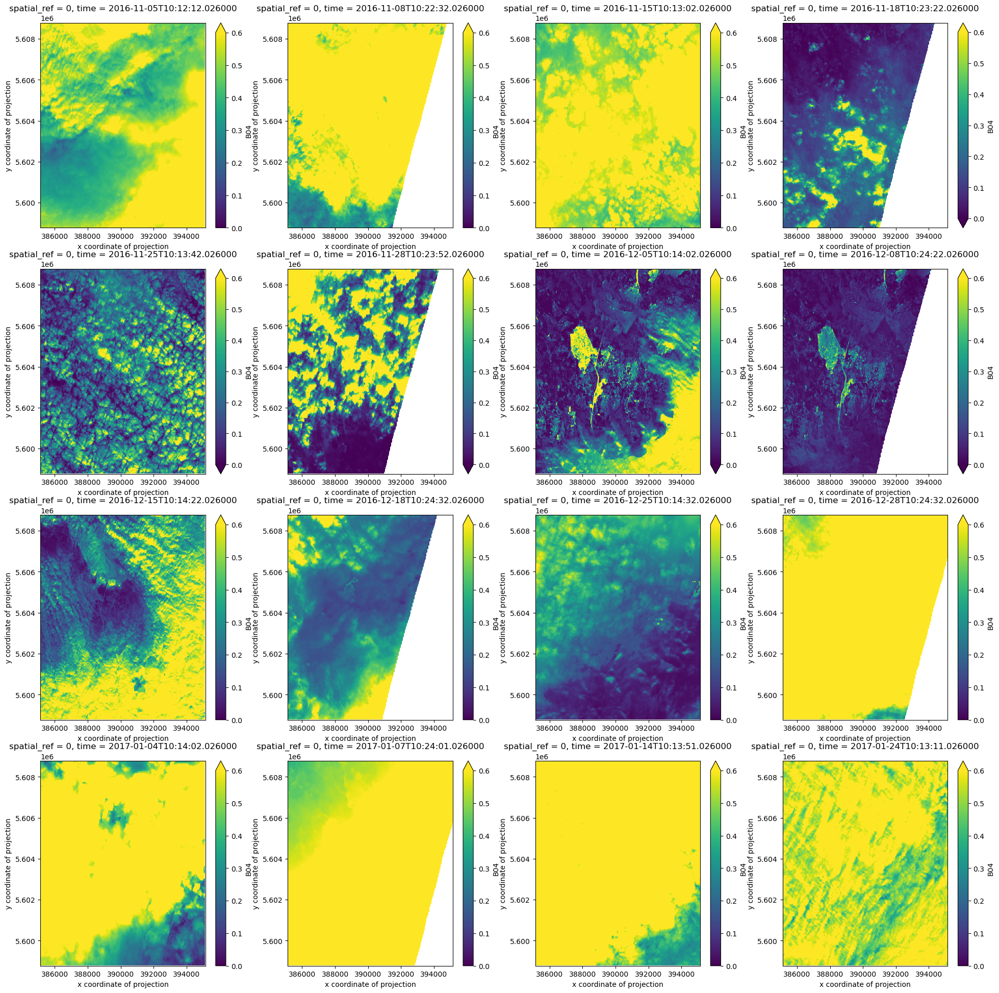

In [5]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.B04.isel(time=i).plot(ax=ax[i], vmin=0., vmax=0.6)

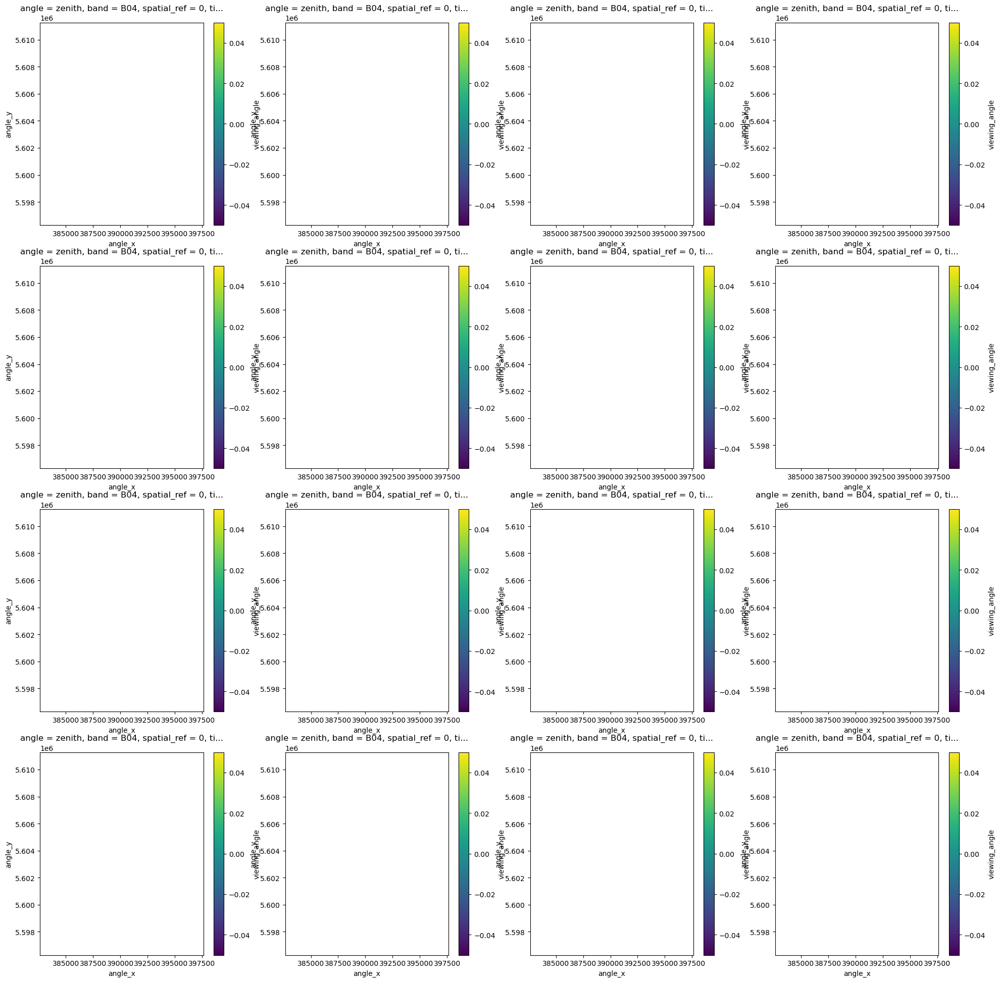

In [6]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.viewing_angle.isel(time=i, band=3, angle=0).plot(ax=ax[i])

---
## Cube 33

In [7]:
for year in range(2017, 2025):
    data_id_year = f"cubes/temp/science/0.1.0/033_{year}.zarr"
    print(year)
    print(s3_store.has_data(data_id_year))

2017
False
2018
True
2019
True
2020
True
2021
True
2022
True
2023
True
2024
True


In [12]:
dss = []
for year in range(2017, 2025):
    data_id_year = f"cubes/temp/science/0.1.0/033_{year}.zarr"
    ds = s3_store.open_data(data_id_year)
    key = "viewing_angle"
    array = ds[key].values.ravel()
    null_size = array[np.isnan(array)].size
    perc = (null_size / array.size) * 100
    print(f"Data variable {key} has {perc:.3f}% nan values.")

Data variable viewing_angle has 37.908% nan values.
Data variable viewing_angle has 35.837% nan values.
Data variable viewing_angle has 35.811% nan values.
Data variable viewing_angle has 37.918% nan values.
Data variable viewing_angle has 34.691% nan values.
Data variable viewing_angle has 34.496% nan values.
Data variable viewing_angle has 34.982% nan values.
Data variable viewing_angle has 35.326% nan values.


In [3]:
ds = s3_store.open_data("cubes/temp/science/0.1.0/033_2017.zarr")
ds

<xarray.Dataset> Size: 7GB
Dimensions:        (time: 136, y: 1001, x: 1001, angle: 2, angle_x: 3,
                    angle_y: 3, band: 12)
Coordinates:
  * angle          (angle) object 16B 'zenith' 'azimuth'
  * angle_x        (angle_x) float64 24B 2.737e+05 2.787e+05 2.837e+05
  * angle_y        (angle_y) float64 24B 5.149e+06 5.144e+06 5.139e+06
  * band           (band) <U3 144B 'B01' 'B02' 'B03' 'B04' ... 'B09' 'B11' 'B12'
    spatial_ref    int64 8B ...
  * time           (time) datetime64[ns] 1kB 2016-11-07T10:52:42.026000 ... 2...
  * x              (x) float64 8kB 2.737e+05 2.737e+05 ... 2.837e+05 2.837e+05
  * y              (y) float64 8kB 5.149e+06 5.149e+06 ... 5.139e+06 5.139e+06
Data variables: (12/15)
    B01            (time, y, x) float32 545MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B02            (time, y, x) float32 545MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B03            (time, y, x) float32 545MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B04            (time, y, x) float32 545MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B05            (time, y, x) float32 545MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B06            (time, y, x) float32 545MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    ...             ...
    B11            (time, y, x) float32 545MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B12            (time, y, x) float32 545MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B8A            (time, y, x) float32 545MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    SCL            (time, y, x) uint16 273MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    solar_angle    (angle, time, angle_y, angle_x) float32 10kB dask.array<chunksize=(2, 1, 3, 3), meta=np.ndarray>
    viewing_angle  (angle, band, time, angle_y, angle_x) float32 118kB dask.array<chunksize=(2, 12, 1, 3, 3), meta=np.ndarray>
Attributes: (13)

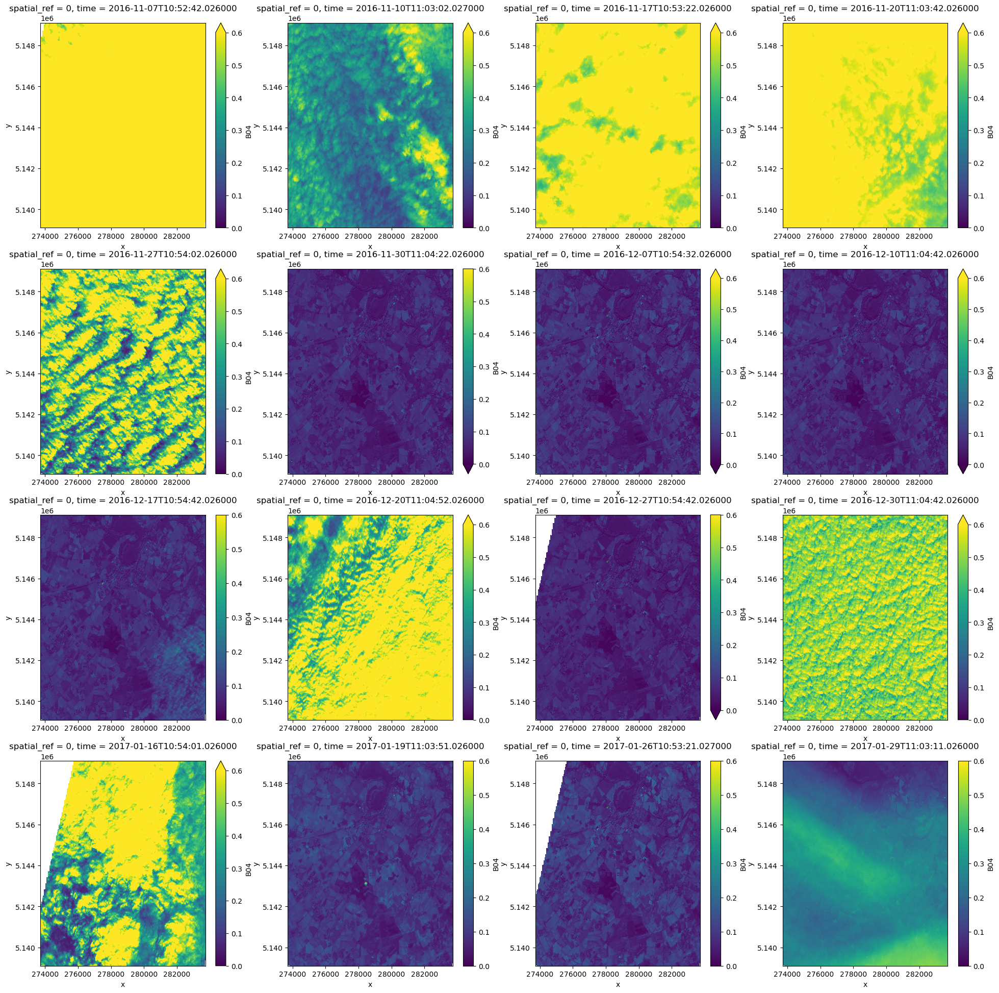

In [4]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.B04.isel(time=i).plot(ax=ax[i], vmin=0., vmax=0.6)

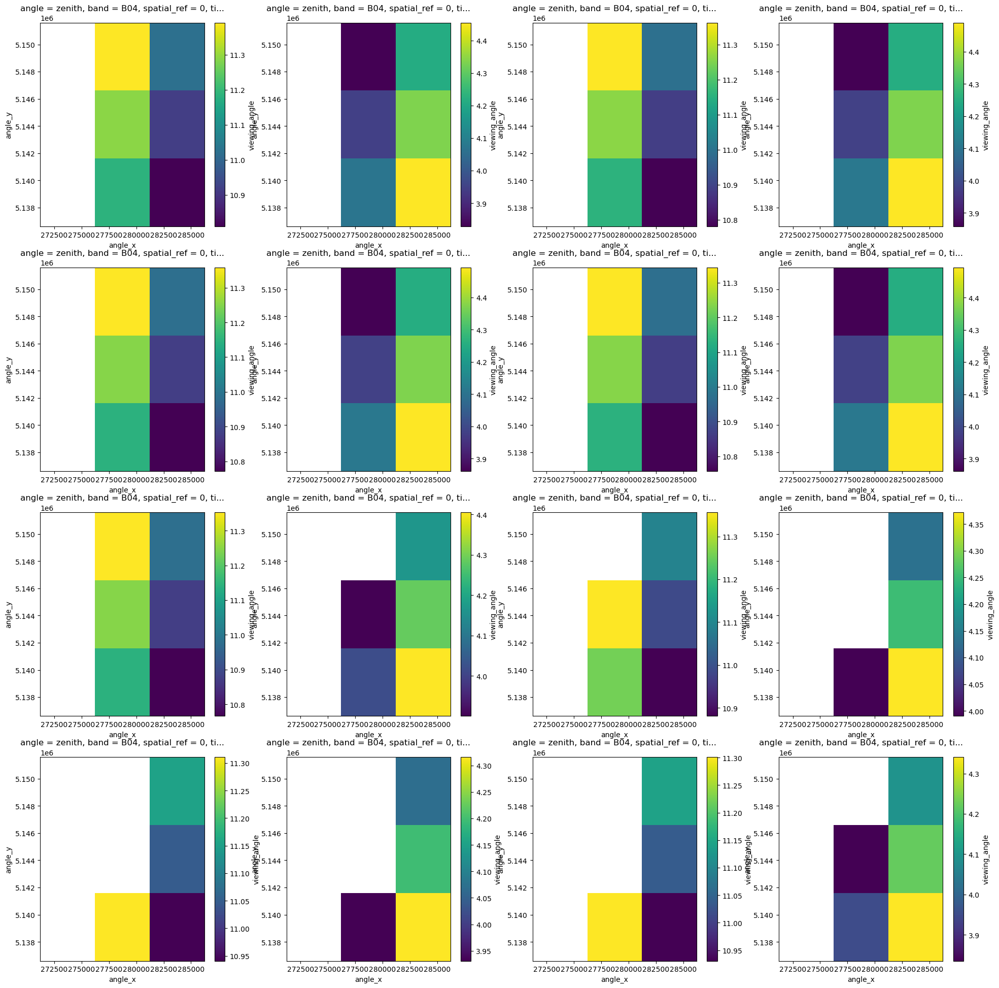

In [5]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.viewing_angle.isel(time=i, band=3, angle=0).plot(ax=ax[i])

---
## Cube 24 

In [14]:
ds = s3_store.open_data("cubes/temp/science/0.1.0/024_2019.zarr")
ds

<xarray.Dataset> Size: 7GB
Dimensions:        (time: 133, y: 1001, x: 1001, angle: 2, angle_x: 3,
                    angle_y: 3, band: 12)
Coordinates:
  * angle          (angle) object 16B 'zenith' 'azimuth'
  * angle_x        (angle_x) float64 24B 6.329e+05 6.379e+05 6.429e+05
  * angle_y        (angle_y) float64 24B 6.669e+06 6.664e+06 6.659e+06
  * band           (band) <U3 144B 'B01' 'B02' 'B03' 'B04' ... 'B09' 'B11' 'B12'
    spatial_ref    int64 8B ...
  * time           (time) datetime64[ns] 1kB 2019-01-14T11:13:51.024000 ... 2...
  * x              (x) float64 8kB 6.329e+05 6.329e+05 ... 6.429e+05 6.429e+05
  * y              (y) float64 8kB 6.669e+06 6.669e+06 ... 6.659e+06 6.659e+06
Data variables: (12/15)
    B01            (time, y, x) float32 533MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B02            (time, y, x) float32 533MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B03            (time, y, x) float32 533MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B04            (time, y, x) float32 533MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B05            (time, y, x) float32 533MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B06            (time, y, x) float32 533MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    ...             ...
    B11            (time, y, x) float32 533MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B12            (time, y, x) float32 533MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B8A            (time, y, x) float32 533MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    SCL            (time, y, x) uint16 267MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    solar_angle    (angle, time, angle_y, angle_x) float32 10kB dask.array<chunksize=(2, 1, 3, 3), meta=np.ndarray>
    viewing_angle  (angle, band, time, angle_y, angle_x) float64 230kB dask.array<chunksize=(2, 12, 1, 3, 3), meta=np.ndarray>
Attributes: (2)

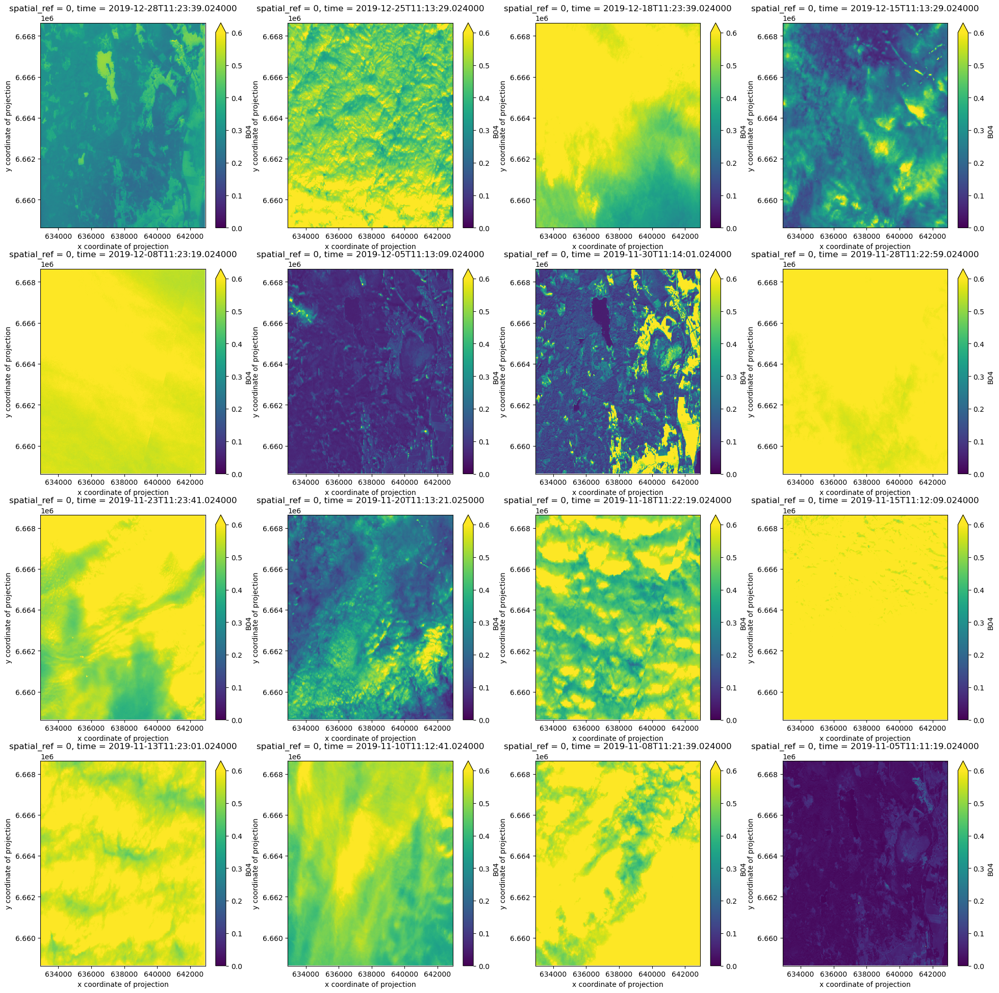

In [15]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.B04.isel(time=-(i+1)).plot(ax=ax[i], vmin=0., vmax=0.6)

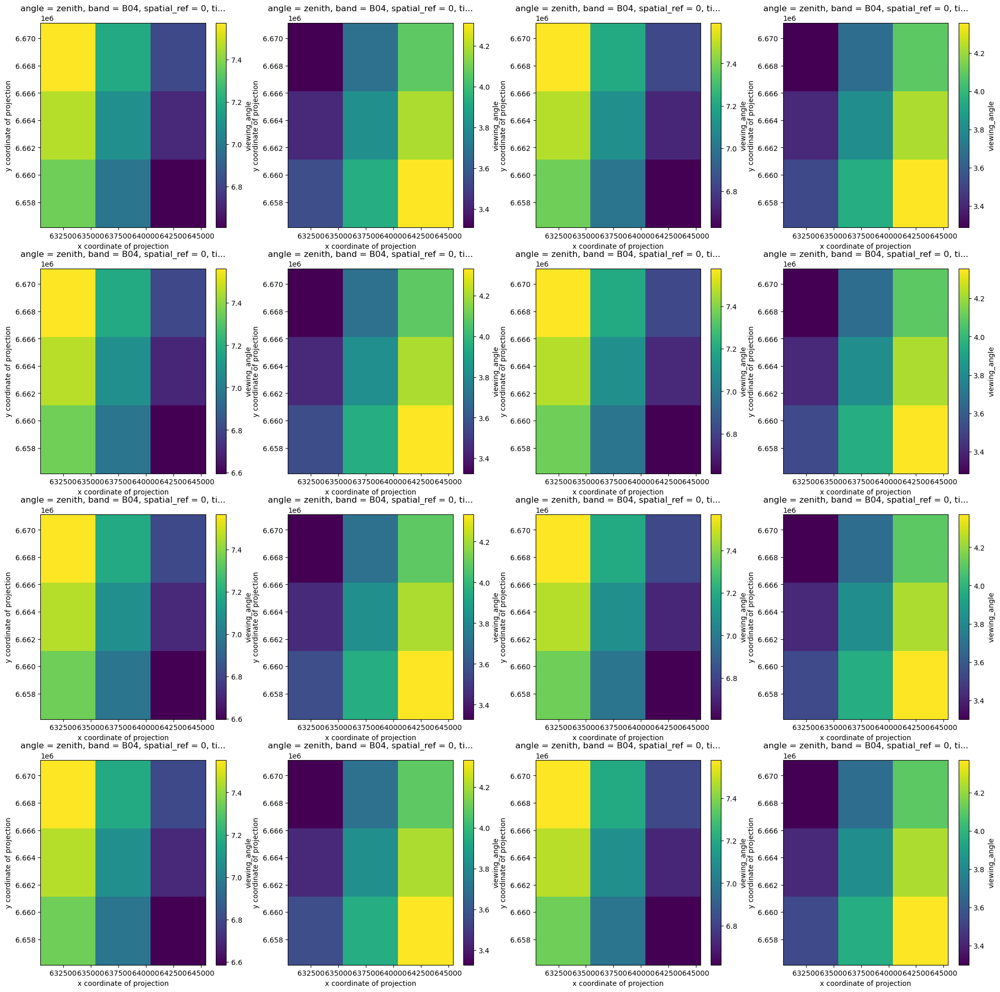

In [16]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.viewing_angle.isel(time=i, band=3, angle=0).plot(ax=ax[i])

---
## Cube 64

In [8]:
ds = s3_store.open_data("cubes/temp/science/0.1.0/064_2017.zarr")
ds

<xarray.Dataset> Size: 6GB
Dimensions:        (time: 128, y: 1001, x: 1001, angle: 2, angle_x: 3,
                    angle_y: 3, band: 12)
Coordinates:
  * angle          (angle) object 16B 'zenith' 'azimuth'
  * angle_x        (angle_x) float64 24B 4.439e+05 4.489e+05 4.539e+05
  * angle_y        (angle_y) float64 24B 5.385e+06 5.38e+06 5.375e+06
  * band           (band) <U3 144B 'B01' 'B02' 'B03' 'B04' ... 'B09' 'B11' 'B12'
    spatial_ref    int64 8B ...
  * time           (time) datetime64[ns] 1kB 2016-11-01T10:32:02.026000 ... 2...
  * x              (x) float64 8kB 4.439e+05 4.439e+05 ... 4.539e+05 4.539e+05
  * y              (y) float64 8kB 5.385e+06 5.385e+06 ... 5.375e+06 5.375e+06
Data variables: (12/15)
    B01            (time, y, x) float32 513MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B02            (time, y, x) float32 513MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B03            (time, y, x) float32 513MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B04            (time, y, x) float32 513MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B05            (time, y, x) float32 513MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B06            (time, y, x) float32 513MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    ...             ...
    B11            (time, y, x) float32 513MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B12            (time, y, x) float32 513MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B8A            (time, y, x) float32 513MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    SCL            (time, y, x) uint16 257MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    solar_angle    (angle, time, angle_y, angle_x) float32 9kB dask.array<chunksize=(2, 1, 3, 3), meta=np.ndarray>
    viewing_angle  (angle, band, time, angle_y, angle_x) float64 221kB dask.array<chunksize=(2, 12, 1, 3, 3), meta=np.ndarray>
Attributes: (2)

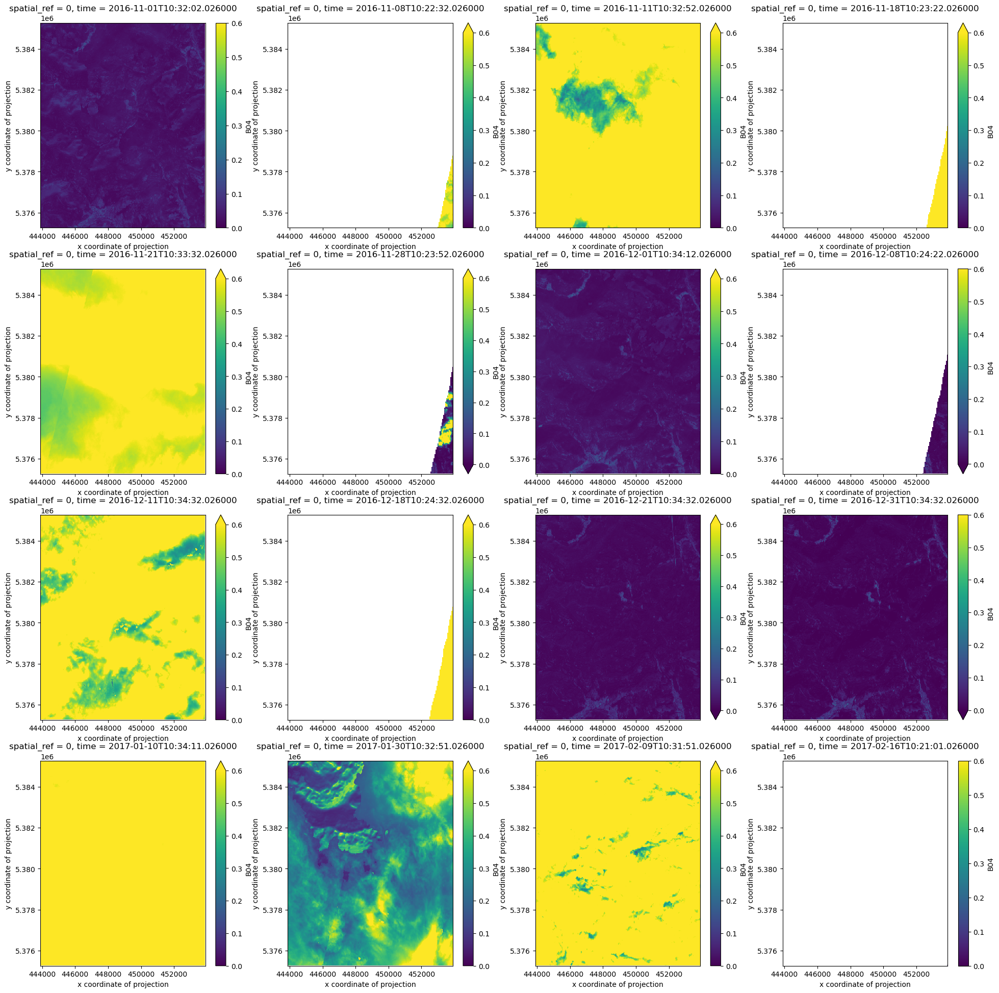

In [9]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.B04.isel(time=i).plot(ax=ax[i], vmin=0., vmax=0.6)

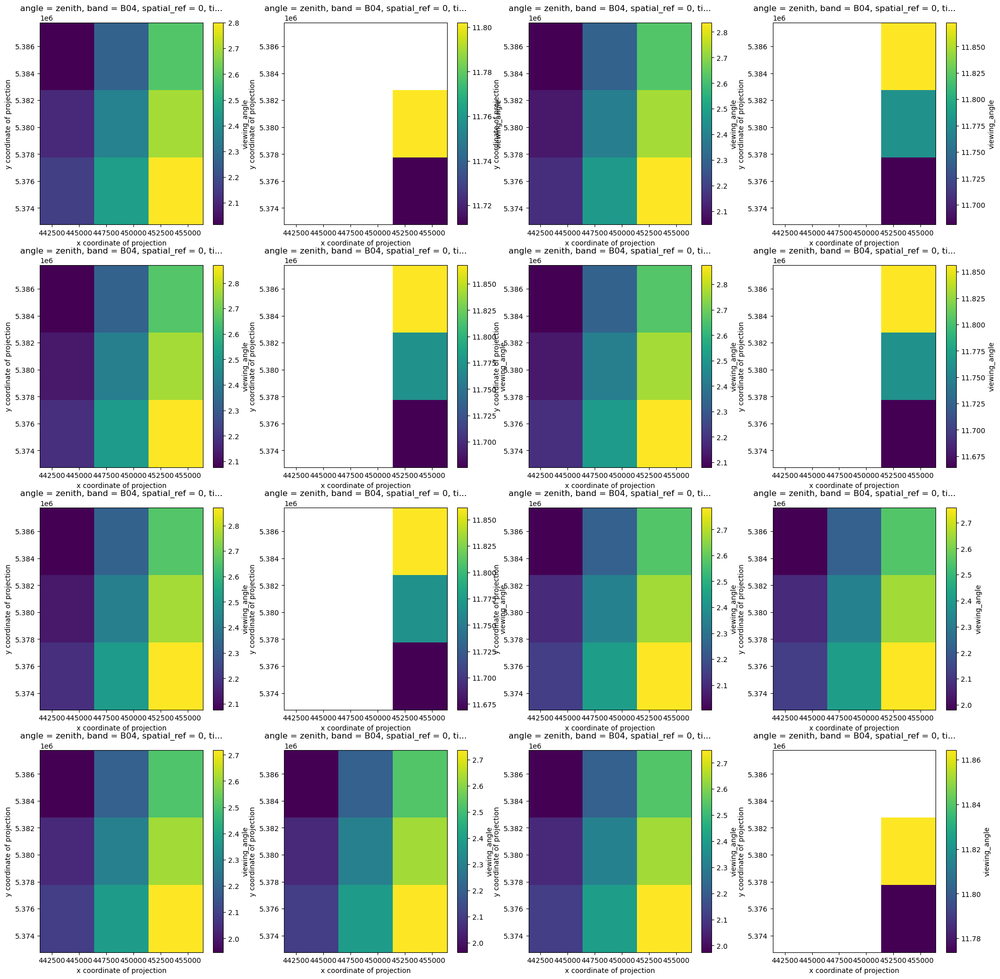

In [10]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.viewing_angle.isel(time=i, band=3, angle=0).plot(ax=ax[i])

In [11]:
ds = s3_store.open_data("cubes/temp/science/0.1.0/064_2018.zarr")
ds

<xarray.Dataset> Size: 7GB
Dimensions:        (time: 141, y: 1001, x: 1001, angle: 2, angle_x: 3,
                    angle_y: 3, band: 12)
Coordinates:
  * angle          (angle) object 16B 'zenith' 'azimuth'
  * angle_x        (angle_x) float64 24B 4.439e+05 4.489e+05 4.539e+05
  * angle_y        (angle_y) float64 24B 5.385e+06 5.38e+06 5.375e+06
  * band           (band) <U3 144B 'B01' 'B02' 'B03' 'B04' ... 'B09' 'B11' 'B12'
    spatial_ref    int64 8B ...
  * time           (time) datetime64[ns] 1kB 2018-01-02T10:24:21.026000 ... 2...
  * x              (x) float64 8kB 4.439e+05 4.439e+05 ... 4.539e+05 4.539e+05
  * y              (y) float64 8kB 5.385e+06 5.385e+06 ... 5.375e+06 5.375e+06
Data variables: (12/15)
    B01            (time, y, x) float32 565MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B02            (time, y, x) float32 565MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B03            (time, y, x) float32 565MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B04            (time, y, x) float32 565MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B05            (time, y, x) float32 565MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B06            (time, y, x) float32 565MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    ...             ...
    B11            (time, y, x) float32 565MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B12            (time, y, x) float32 565MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B8A            (time, y, x) float32 565MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    SCL            (time, y, x) uint16 283MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    solar_angle    (angle, time, angle_y, angle_x) float32 10kB dask.array<chunksize=(2, 1, 3, 3), meta=np.ndarray>
    viewing_angle  (angle, band, time, angle_y, angle_x) float64 244kB dask.array<chunksize=(2, 12, 1, 3, 3), meta=np.ndarray>
Attributes: (2)

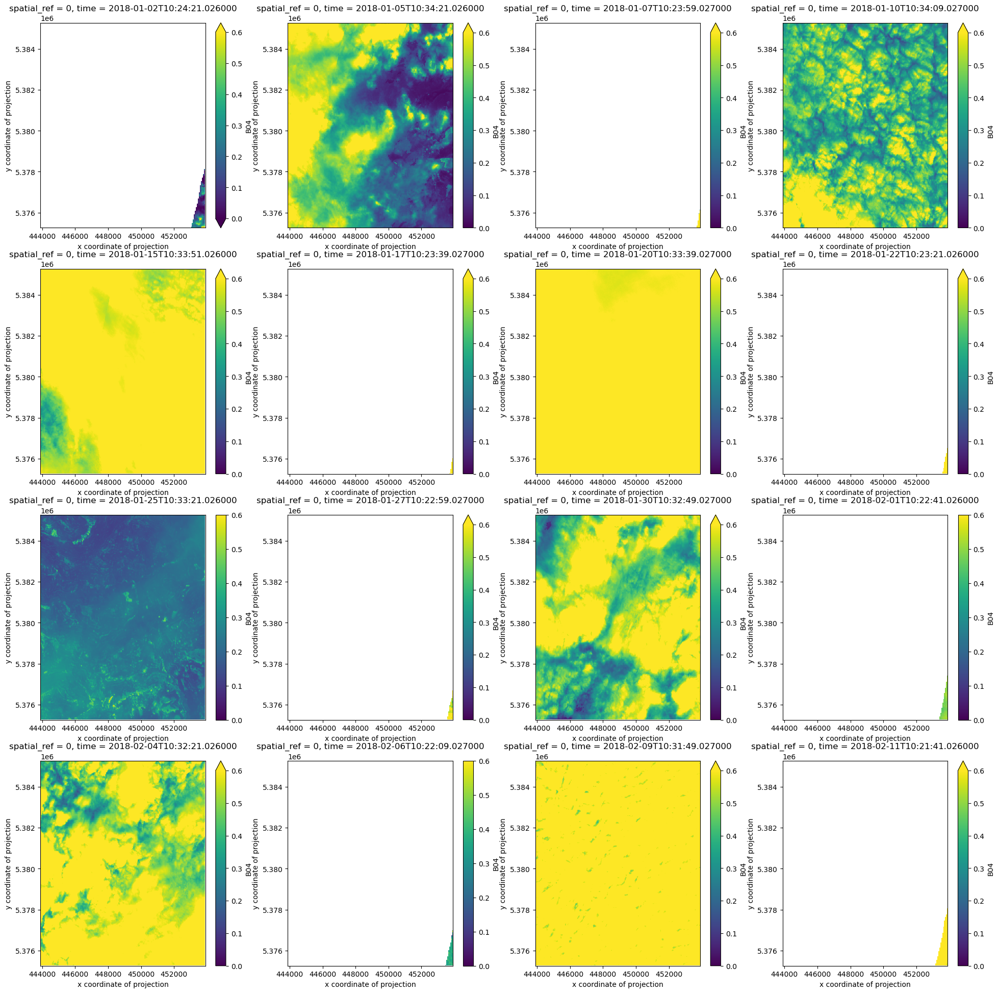

In [12]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.B04.isel(time=i).plot(ax=ax[i], vmin=0., vmax=0.6)

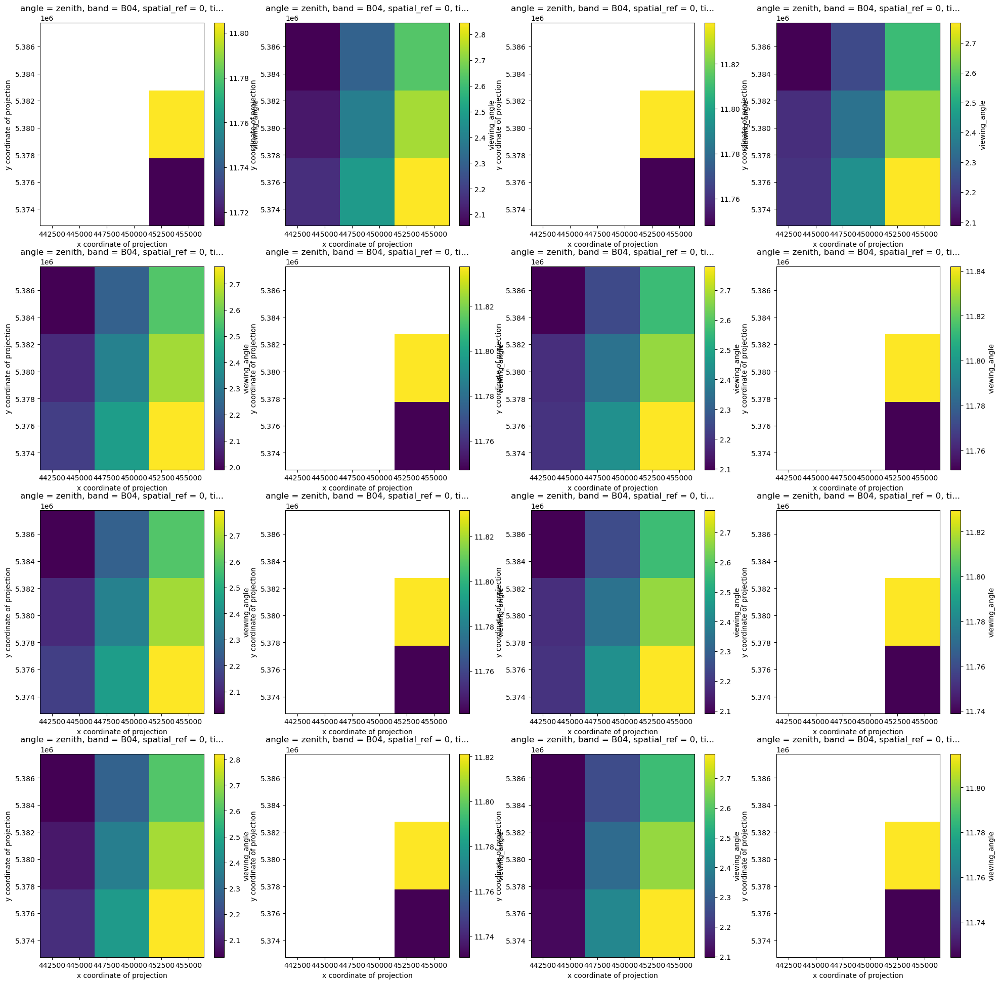

In [13]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.viewing_angle.isel(time=i, band=3, angle=0).plot(ax=ax[i])

In [14]:
ds = s3_store.open_data("cubes/temp/science/0.1.0/064_2022.zarr")
ds

<xarray.Dataset> Size: 7GB
Dimensions:        (time: 143, y: 1001, x: 1001, angle: 2, angle_x: 3,
                    angle_y: 3, band: 12)
Coordinates:
  * angle          (angle) object 16B 'zenith' 'azimuth'
  * angle_x        (angle_x) float64 24B 4.439e+05 4.489e+05 4.539e+05
  * angle_y        (angle_y) float64 24B 5.385e+06 5.38e+06 5.375e+06
  * band           (band) <U3 144B 'B01' 'B02' 'B03' 'B04' ... 'B09' 'B11' 'B12'
    spatial_ref    int64 8B ...
  * time           (time) datetime64[ns] 1kB 2022-01-01T10:24:31.024000 ... 2...
  * x              (x) float64 8kB 4.439e+05 4.439e+05 ... 4.539e+05 4.539e+05
  * y              (y) float64 8kB 5.385e+06 5.385e+06 ... 5.375e+06 5.375e+06
Data variables: (12/15)
    B01            (time, y, x) float32 573MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B02            (time, y, x) float32 573MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B03            (time, y, x) float32 573MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B04            (time, y, x) float32 573MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B05            (time, y, x) float32 573MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B06            (time, y, x) float32 573MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    ...             ...
    B11            (time, y, x) float32 573MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B12            (time, y, x) float32 573MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    B8A            (time, y, x) float32 573MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    SCL            (time, y, x) uint16 287MB dask.array<chunksize=(1, 1001, 1001), meta=np.ndarray>
    solar_angle    (angle, time, angle_y, angle_x) float32 10kB dask.array<chunksize=(2, 1, 3, 3), meta=np.ndarray>
    viewing_angle  (angle, band, time, angle_y, angle_x) float64 247kB dask.array<chunksize=(2, 12, 1, 3, 3), meta=np.ndarray>
Attributes: (2)

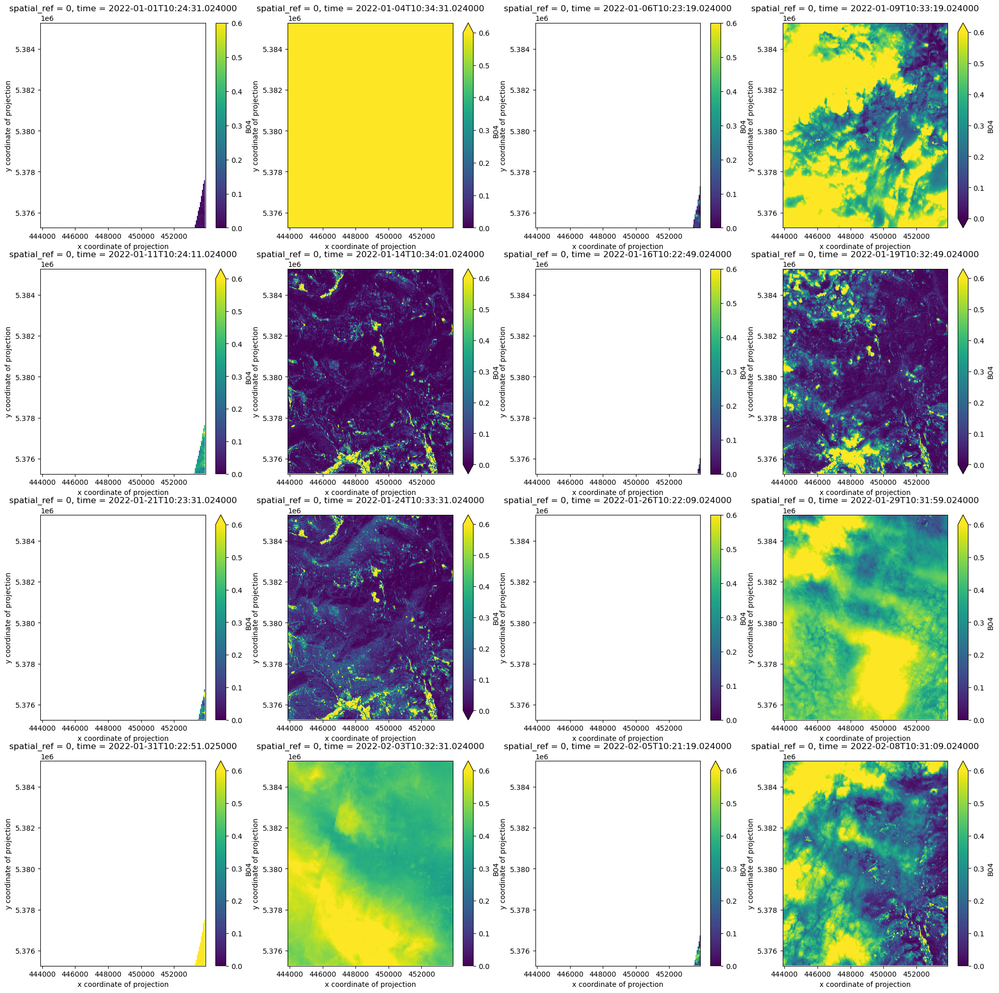

In [15]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.B04.isel(time=i).plot(ax=ax[i], vmin=0., vmax=0.6)

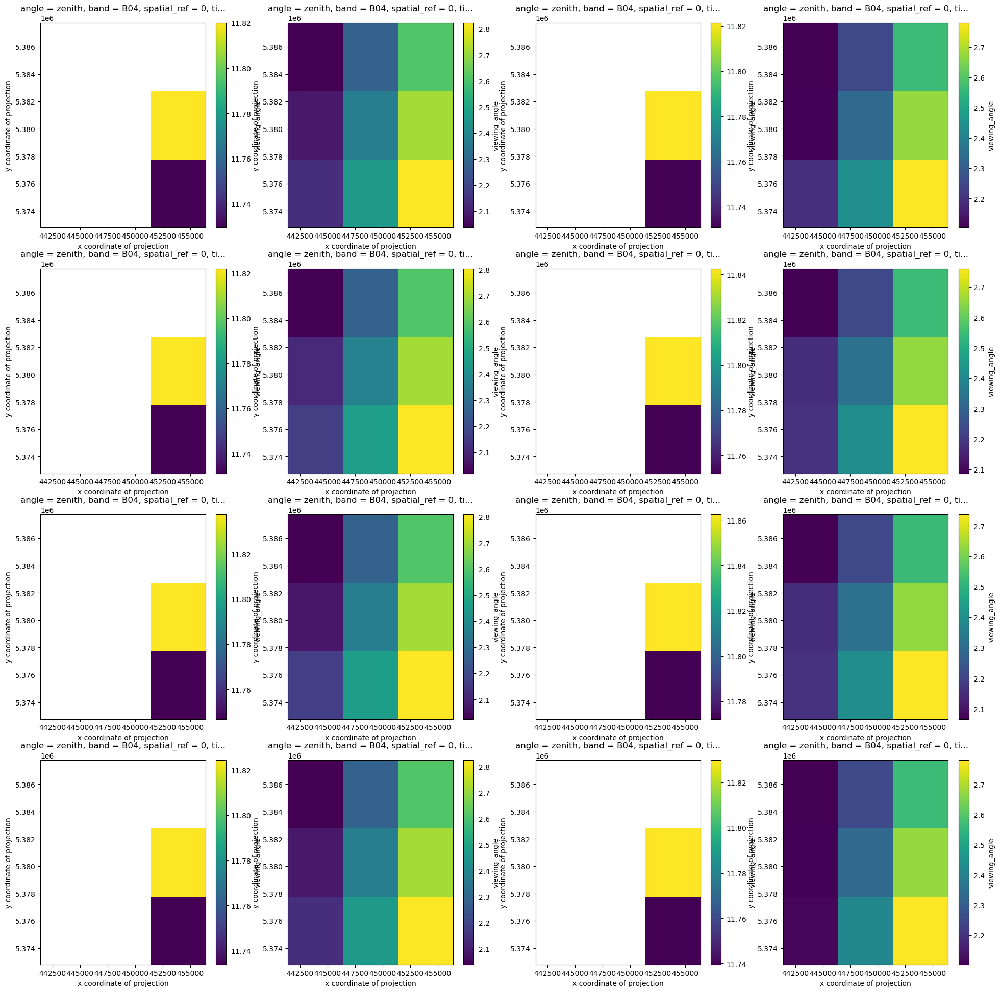

In [16]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.viewing_angle.isel(time=i, band=3, angle=0).plot(ax=ax[i])